    #### Import packages

In [52]:
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import imghdr
import cv2 # installed from opencv-python
import os

#### Define functions

In [64]:
def fetch_data_diode(type):
    """Returns a dataframe of either 'train' or 'val' data type for DIODE dataset."""
    df = pd.read_csv(type + '_outdoor.csv', header=None)
    df = df.drop(df.columns[[3]], axis=1)
    df.columns = ['image', 'depth', 'mask']
    df = df.sample(frac=1)
    df = df.reset_index()

    return df

def fetch_data_kitti():
    """Returns a dataframe for KITTI dataset."""
    df = pd.read_csv('kitti_selection.csv', header=None)
    df.columns = ['image', 'depth']
    df = df.sample(frac=1)
    df = df.reset_index()

    return df

def load_img(img_path):
    """Returns a transformed image."""
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    width = img.shape[1]
    if width == 1024:
        img = cv2.resize(img, (256,192))
    else:
        img = cv2.resize(img, (304,88))

    return img

def load_npy(depth_path, mask_path):
    """Returns the depth map of a numpy array and its mask."""
    if imghdr.what(depth_path) == 'png':
        img = Image.open(depth_path)
        depth = np.asarray(img).squeeze()
    else:
        depth = np.load(depth_path).squeeze()
        depth = cv2.resize(depth, (256,192))
    mask = np.load(mask_path)
    mask = cv2.resize(mask, (256,192))
    mask = mask > 0

    min_depth = 0
    max_depth = min(300, np.percentile(depth, 99))
    depth = np.clip(depth, min_depth, max_depth)
    # depth = np.log(depth, where=mask)
    depth = depth/300

    depth = np.ma.masked_where(~mask, depth)

    return depth

def show_samples_diode(sample1, sample2):
    """Displays the images and depth maps of the training and validation set for DIODE dataset."""
    cmap = plt.cm.jet
    cmap.set_bad(color='black')

    fig, ax = plt.subplots(5, 4, figsize=(40, 40))
    for i in range(5):
        ax[i, 0].imshow(load_img(sample1["image"][i]))
        ax[i, 1].imshow(load_npy(sample1["depth"][i],sample1["mask"][i]), cmap=cmap)
        ax[i, 2].imshow(load_img(sample2["image"][i]))
        ax[i, 3].imshow(load_npy(sample2["depth"][i],sample2["mask"][i]), cmap=cmap)
        for j in range (4):
            ax[i, j].axis('off')

        titles = ['train img', 'train depth', 'val img', 'val depth']
        for i in range(4):
            ax[0, i].set_title(titles[i], fontdict={'fontsize':55})

    plt.tight_layout()
    plt.show()

def show_samples_kitti(sample):
    """Displays the images and depth maps of the training and validation set for KITTI dataset."""
    cmap = plt.cm.jet
    cmap.set_bad(color='black')

    fig, ax = plt.subplots(5, 2, figsize=(55, 40))
    for i in range(5):
        ax[i, 0].imshow(load_img(sample["image"][i]))
        ax[i, 1].imshow(np.load(sample["depth"][i]).squeeze(), cmap=cmap)
        for j in range (2):
            ax[i, j].axis('off')

        titles = ['image', 'depth']
        for i in range(2):
            ax[0, i].set_title(titles[i], fontdict={'fontsize':77})

    plt.tight_layout()
    plt.show()

def show_pred_diode(sample):
    """Displays the images, ground truth, and BANet's prediction for DIODE dataset."""
    cmap = plt.cm.jet
    cmap.set_bad(color='black')

    fig, ax = plt.subplots(5, 3, figsize=(40, 50))
    for i in range(5):
        ax[i, 0].imshow(load_img(sample["image"][i]))
        ax[i, 1].imshow(load_npy(sample["depth_truth"][i],sample["mask"][i]), cmap=cmap)
        ax[i, 2].imshow(load_npy(sample["depth_pred"][i], sample["mask"][i]), cmap=cmap)
        for j in range (3):
            ax[i, j].axis('off')

        titles = ['val img', 'ground truth', 'prediction']
        for i in range(3):
            ax[0, i].set_title(titles[i], fontdict={'fontsize':55})

    plt.tight_layout()
    plt.show()

def show_pred_kitti(sample):
    """Displays the images, ground truth, and BANet's prediction for KITTI dataset."""
    cmap = plt.cm.jet
    cmap.set_bad(color='black')

    fig, ax = plt.subplots(5, 3, figsize=(40, 50))
    for i in range(5):
        ax[i, 0].imshow(load_img(sample["image"][i]))
        ax[i, 1].imshow(np.load(sample["depth_truth"][i]).squeeze(), cmap=cmap)
        ax[i, 2].imshow(np.load(sample["depth_pred"][i]).squeeze(), cmap=cmap)
        for j in range (3):
            ax[i, j].axis('off')

        titles = ['image', 'ground truth', 'prediction']
        for i in range(3):
            ax[0, i].set_title(titles[i], fontdict={'fontsize':55})

    plt.tight_layout()
    plt.show()

 #### Visualize DIODE samples

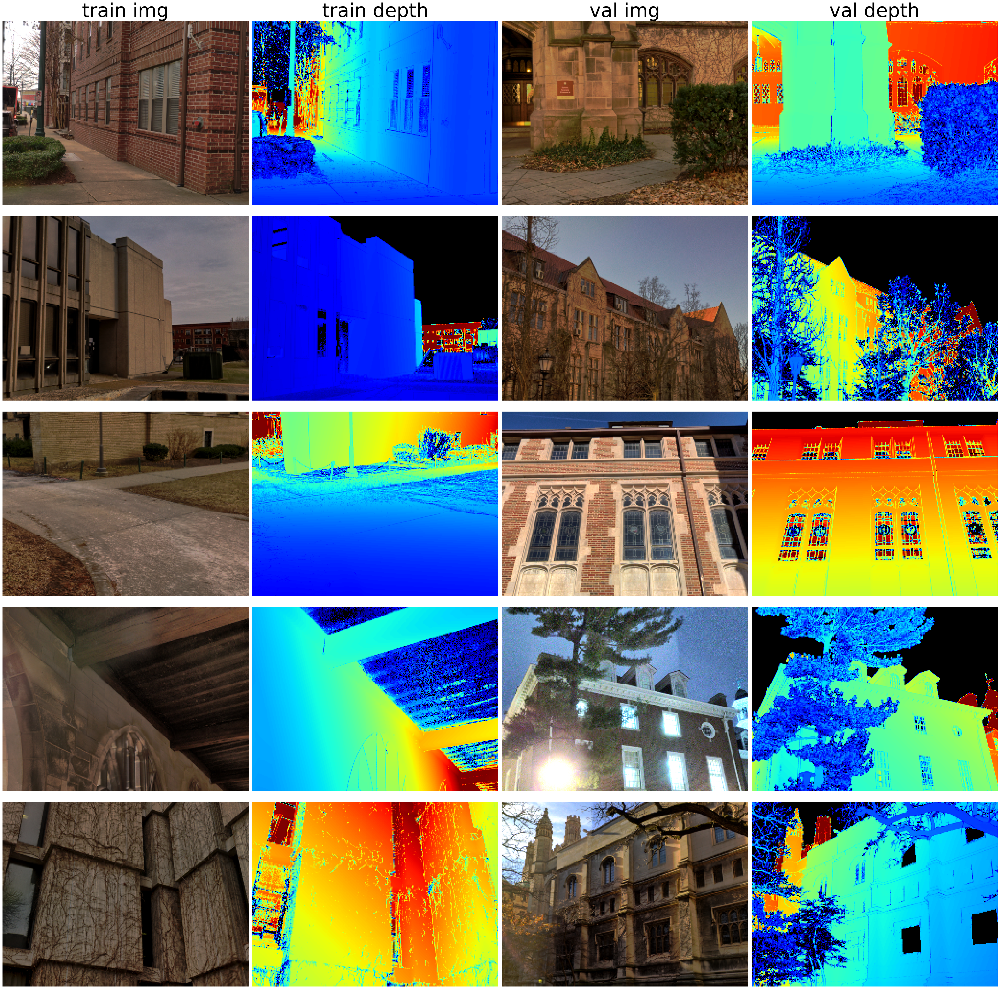

In [66]:
# prepare datasets
os.chdir('D:\\Informatics\\Μεταπτυχιακό\\Εξάμηνο Γ\\dataset\\DIODE')
train = fetch_data_diode('train')
val = fetch_data_diode('val')

# show samples
show_samples_diode(train, val)

#### Show DIODE prediction

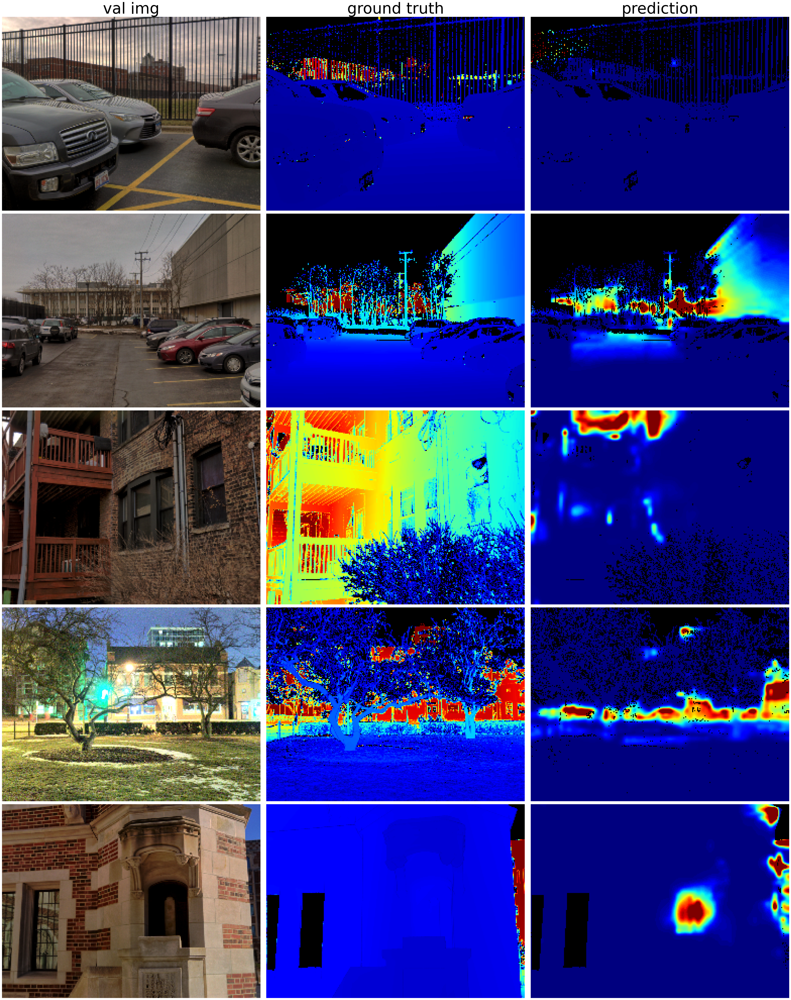

In [67]:
# prepare datasets
os.chdir('D:\\Informatics\\Μεταπτυχιακό\\Εξάμηνο Γ\\models\\LapDepth')
val = pd.read_csv('datasets/eigen_test_files_with_gt_dense.txt', sep=" ", header=None)
val.columns = ['image', 'depth', 'diode']
files = os.listdir('prediction\\DIODE')
test = pd.DataFrame(index=range(len(files)),columns=range(4))
test.columns = ['image', 'depth_truth', 'depth_pred', 'mask']

# drop rows
for i in range(len(val)):
    temp = val['image'][i].split('/')
    if (temp[1]=='2011_09_26_drive_0002_sync' and temp[2]=='image_02') or (temp[1]=='2011_09_26_drive_0005_sync' and temp[2]=='image_02'):
        val = val.drop(i)
val = val.reset_index()

# fill the test dataset
for i in range(len(files)):
    temp = val['diode'][i].split('/')
    test['image'][i] = val['diode'][i]
    test['depth_truth'][i] = val['diode'][i][:-4]+'_depth.npy'
    test['depth_pred'][i] = '../../models/LapDepth/prediction/DIODE/'+files[i]
    test['mask'][i] = val['diode'][i][:-4]+'_depth_mask.npy'

# shuffle the test dataset
test = test.sample(frac=1)
test = test.reset_index()

# show samples
os.chdir('D:\\Informatics\\Μεταπτυχιακό\\Εξάμηνο Γ\\dataset\\DIODE')
show_pred_diode(test)

#### Visualize KITTI samples

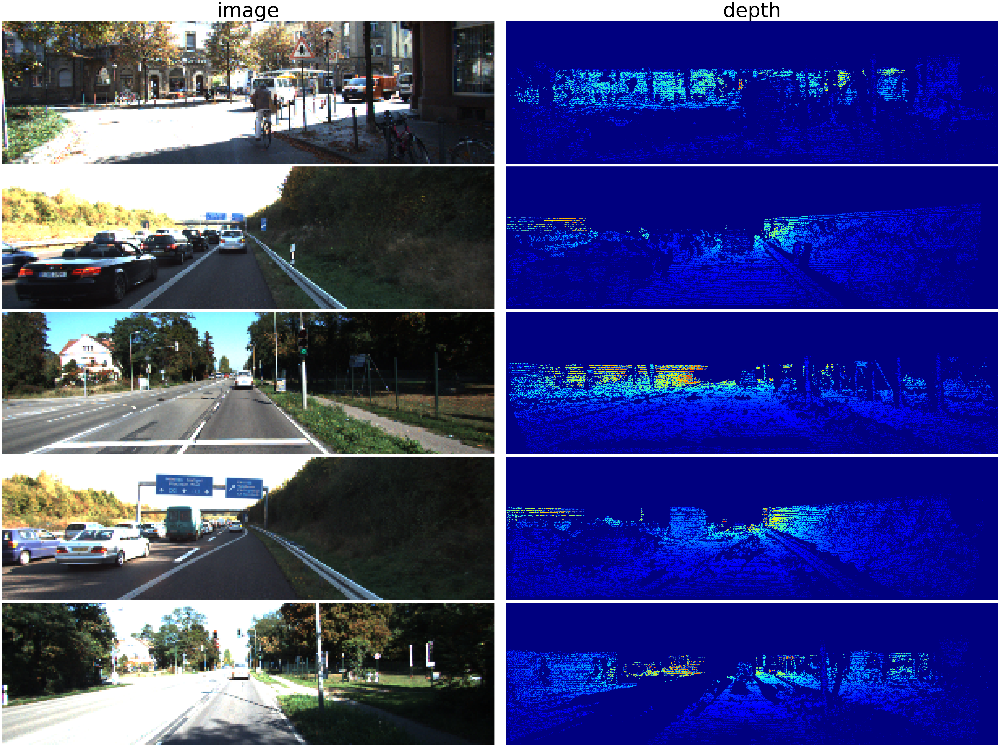

In [68]:
# prepare datasets
os.chdir('D:\\Informatics\\Μεταπτυχιακό\\Εξάμηνο Γ\\dataset\\KITTI')
kitti = fetch_data_kitti()

# show samples
show_samples_kitti(kitti)

#### Show KITTI prediction

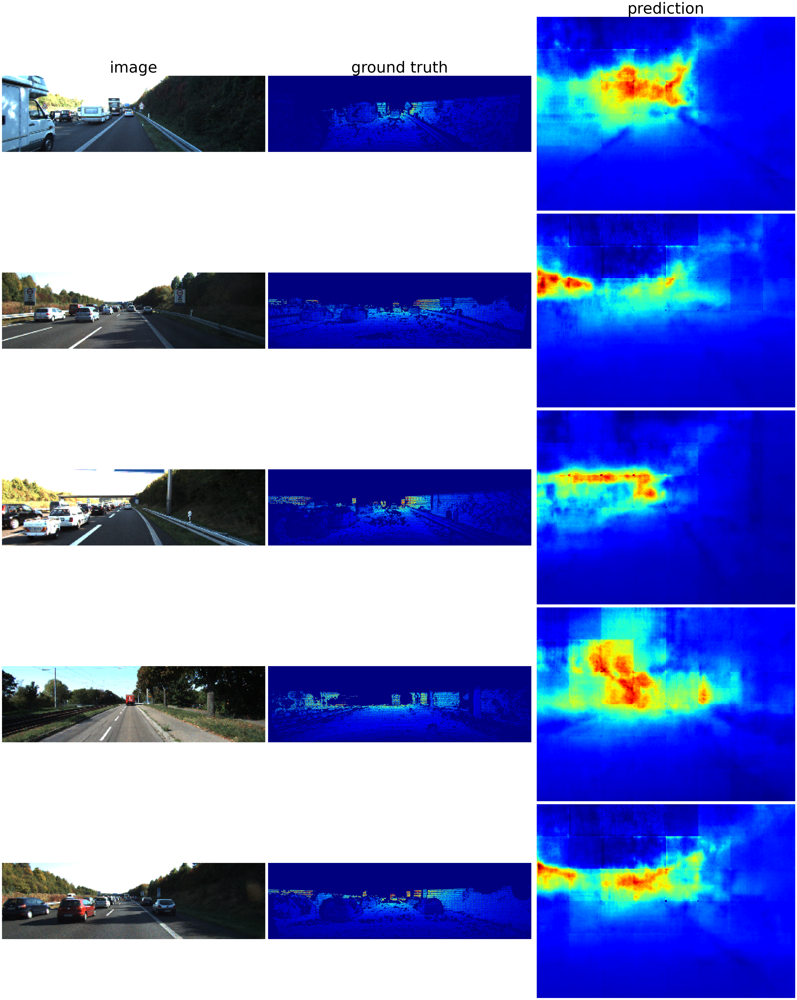

In [5]:
# prepare datasets
os.chdir('D:\\Informatics\\Μεταπτυχιακό\\Εξάμηνο Γ\\dataset\\KITTI')
kitti = fetch_data_kitti()
files = os.listdir('D:\\Informatics\\Μεταπτυχιακό\\Εξάμηνο Γ\\models\\BANet\\prediction\\KITTI')
test = pd.DataFrame(index=range(len(files)),columns=range(3))
test.columns = ['image', 'depth_truth', 'depth_pred']

# fill the test dataset
for i in range(len(files)):
    for j in range(len(kitti)):
        temp = kitti['depth'][j].split('/')
        if temp[3] == files[i]:
            test['image'][i] = kitti['image'][j]
            test['depth_truth'][i] = kitti['depth'][j]
            test['depth_pred'][i] = '../../models/BANet/prediction/KITTI/' + files[i]
            break

# shuffle the test dataset
test = test.sample(frac=1)
test = test.reset_index()

# show samples
show_pred_kitti(test)

#### Show model metrics

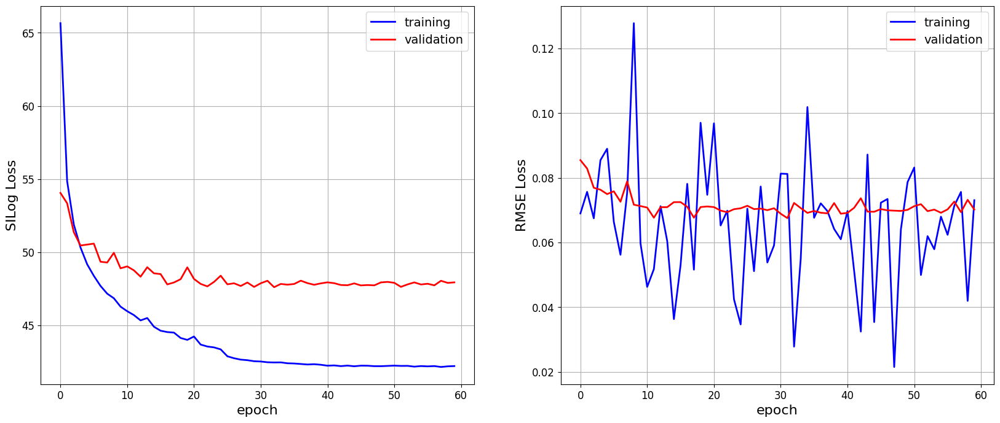

In [13]:
# prepare metrics dataframe
os.chdir('D:\\Informatics\\Μεταπτυχιακό\\Εξάμηνο Γ\\models\\BANet\\metrics')
metrics = pd.read_csv('tmetrics.csv')

# show the results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))

# Plot train-val SILog Loss
ax1.plot(metrics['train_silog'], 'b', linewidth=2)
ax1.plot(metrics['val_silog'], 'r', linewidth=2)
ax1.legend(['training', 'validation'], fontsize=14)
ax1.set_xlabel('epoch', fontsize=16)
ax1.set_ylabel('SILog Loss', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=12)
ax1.grid()

# Plot train-val RMSE Loss
ax2.plot(metrics['train_rmse_loss'], 'b', linewidth=2)
ax2.plot(metrics['val_rmse_loss'], 'r', linewidth=2)
ax2.legend(['training', 'validation'], fontsize=14)
ax2.set_xlabel('epoch', fontsize=16)
ax2.set_ylabel('RMSE Loss', fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=12)
ax2.grid()